# Read markup and filter images by pilots count

In [1]:
import json

MARKUP_JSON = '..\..\..\merged_markup.json'

with open(MARKUP_JSON) as f:
    markup_data = json.load(f)

In [2]:
from typing import List
import os


def filter_marked_images_by_pilots_count(pilots_count: int):
    filtered_imgs = {}
    
    for dataset_part in markup_data.keys():
        markup = markup_data[dataset_part]
    
        for img_name, markup_line in markup.items():
            pilots_ids = markup_line.split(';')
            
            if len(markup_line) == 0:
                pilots_ids = []
            
            if len(pilots_ids) == pilots_count:
                filtered_imgs[os.path.join(dataset_part, img_name)] = markup_line
                
    return filtered_imgs

There are 3092 marked images in dataset


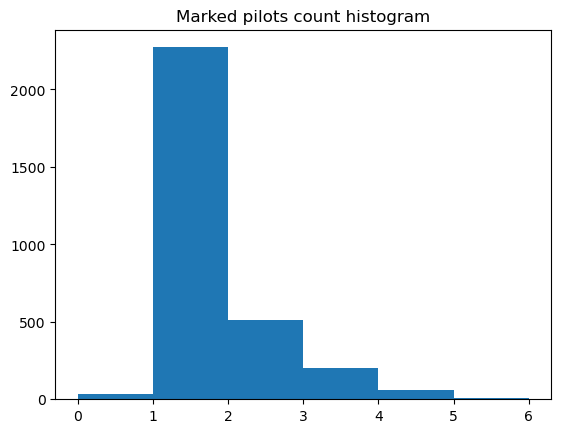

In [3]:
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline


def plot_bar_with_pilot_counts():
    pilot_counts = []
    
    for dataset_part in markup_data.keys():
        markup = markup_data[dataset_part]
    
        for img_name, markup_line in markup.items():
            pilots_ids = markup_line.split(';')
            
            if len(markup_line) == 0:
                pilots_ids = []
            
            gt_pilot_count = len(pilots_ids)
            pilot_counts.append(gt_pilot_count)
            
    counts_arr = np.array(pilot_counts)
    
    print(f'There are {len(pilot_counts)} marked images in dataset')
    plt.hist(counts_arr, bins=np.max(counts_arr))
    plt.title('Marked pilots count histogram')
    plt.show()
    
    return np.max(counts_arr)

    
max_gt_pilots_count = plot_bar_with_pilot_counts()

# Estimate mistakes count

To make the calculations not so long, we will limit to a maximum of 200 images for each of the number of pilots in the image.

In [4]:
import sys
sys.path.append('..')

from src.render import show_examples, segment_moto_on_image
from src import Processing

In [5]:
from tqdm.notebook import tqdm


def get_mistake_images_with_fixed_gt_pilots_count(
    gt_pilots_count: int, processor: Processing,
    max_imgs_num_per_count: int = 200,
):
    filtered_imgs = filter_marked_images_by_pilots_count(pilots_count=gt_pilots_count)
    filtered_imgs = {k: filtered_imgs[k] for k in list(filtered_imgs)[:min(max_imgs_num_per_count, len(filtered_imgs))]}

    mistakes = {}
    
    for img_path, markup_line in tqdm(filtered_imgs.items(), total=len(filtered_imgs)):
        try:
            img_path = os.path.join('..\..\..', img_path)
            segment_results, matched_moto_to_pilots, image = processor.get_moto_masks_on_image(img_path)
        except ValueError:
            continue
        
        pred_pilots_count = len(matched_moto_to_pilots)
        
        if gt_pilots_count != pred_pilots_count:
            mistakes[img_path] = [markup_line, pred_pilots_count]
        
    return mistakes

In [6]:
DATASET_PART_FOLDER = r"C:\Users\Ася\Desktop\Папки\Учёба\project_FotoMoto\8.06(2)MOTORING_25.06.22 JPG"

processor = Processing(
    DATASET_PART_FOLDER,
    conf_thr=0.4, iou_thr=0.65
)

error_images = {}

for gt_pilots_count in range(max_gt_pilots_count + 1):
    error_images[gt_pilots_count] = get_mistake_images_with_fixed_gt_pilots_count(
        gt_pilots_count, processor,
    )


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

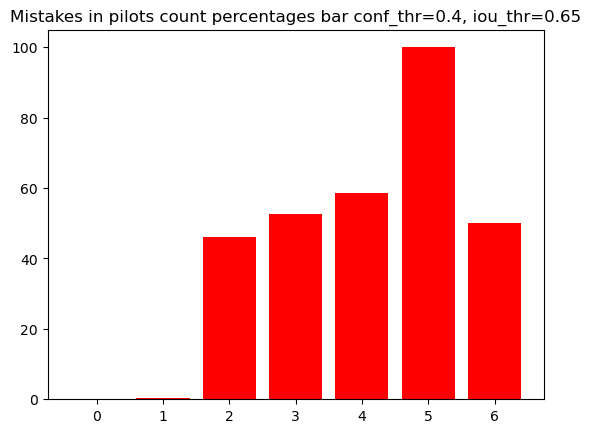

In [10]:
def plot_errors_percentage_bar(
    error_images, max_gt_pilots_count: int,
    plot_label=None, max_imgs_num_per_count: int = 200
):
    bar_data = {}
    
    for gt_pilots_count in range(max_gt_pilots_count + 1):
        errors_count = len(error_images[gt_pilots_count])
        
        filtered_imgs = filter_marked_images_by_pilots_count(pilots_count=gt_pilots_count)
        all_examples_count = min(max_imgs_num_per_count, len(filtered_imgs))
        
        bar_data[gt_pilots_count] = errors_count / all_examples_count * 100
        
    plt.bar(list(bar_data.keys()), bar_data.values(), color='r')
    
    label = f' {plot_label}' if plot_label is not None else ''
    
    plt.title('Mistakes in pilots count percentages bar' + label)
    plt.show()

    
plot_errors_percentage_bar(error_images, max_gt_pilots_count, plot_label='conf_thr=0.4, iou_thr=0.65')

In [8]:
processor1 = Processing(
    DATASET_PART_FOLDER,
    conf_thr=0.2, iou_thr=0.65
)

error_images_1 = {}

for gt_pilots_count in range(max_gt_pilots_count + 1):
    error_images_1[gt_pilots_count] = get_mistake_images_with_fixed_gt_pilots_count(
        gt_pilots_count, processor1,
    )


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

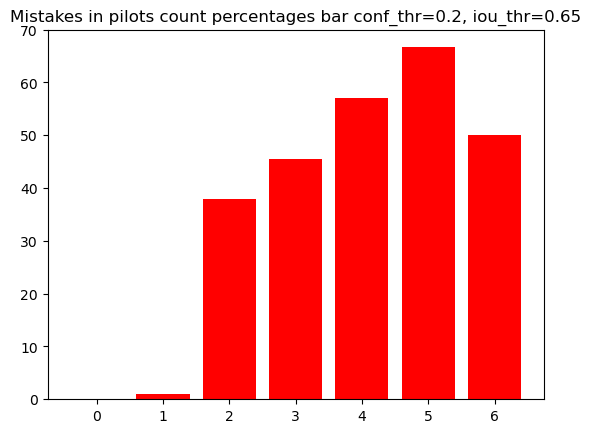

In [11]:
plot_errors_percentage_bar(error_images_1, max_gt_pilots_count, plot_label='conf_thr=0.2, iou_thr=0.65')

There are fewer errors with the confidence threshold = 0.2, so we will consider it as the final value

# Show mistake examples

<Figure size 2000x1500 with 0 Axes>

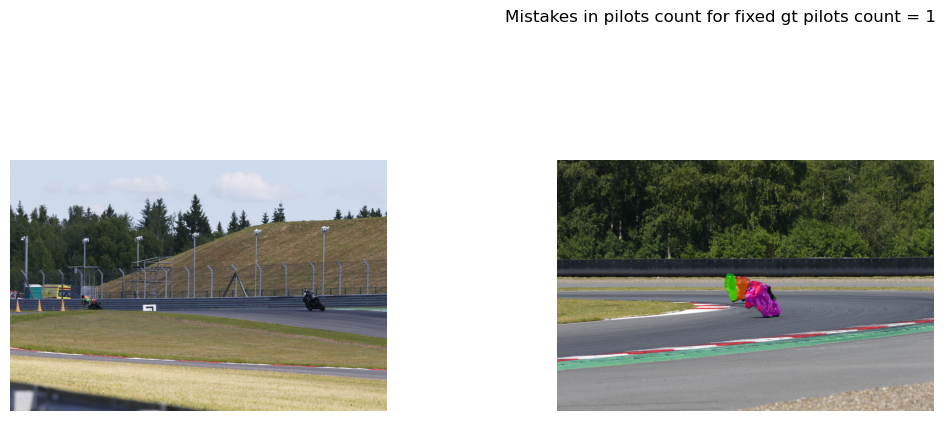

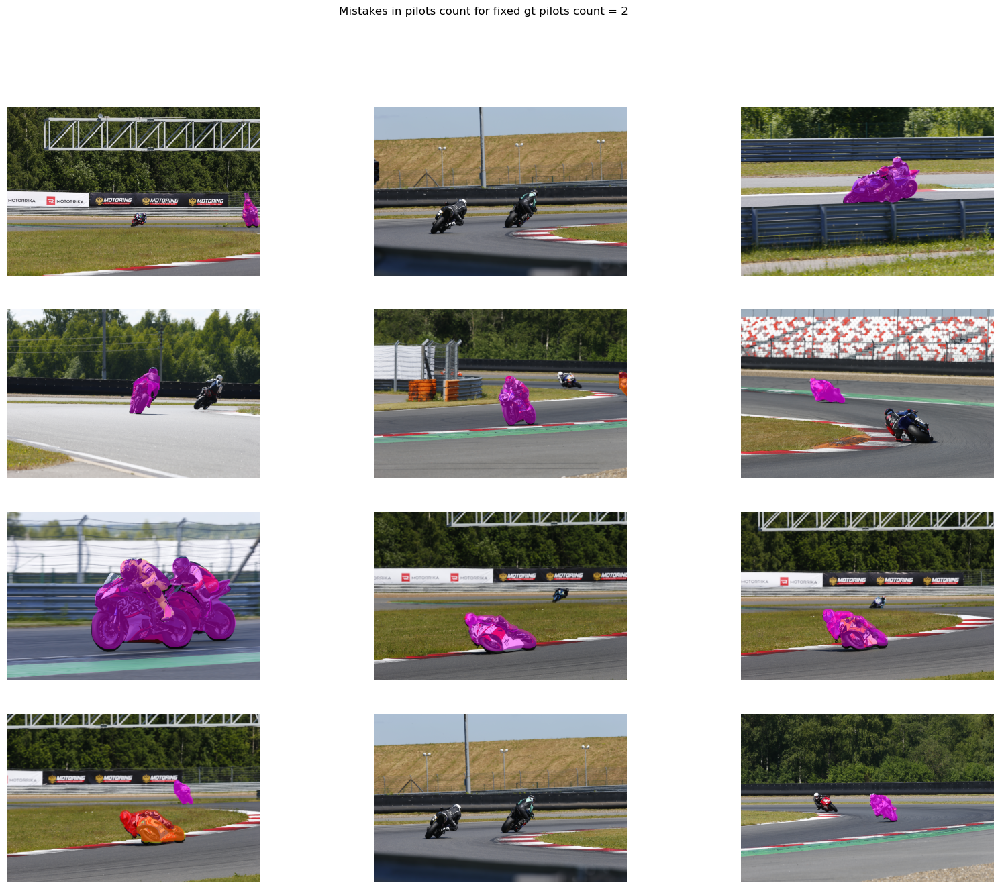

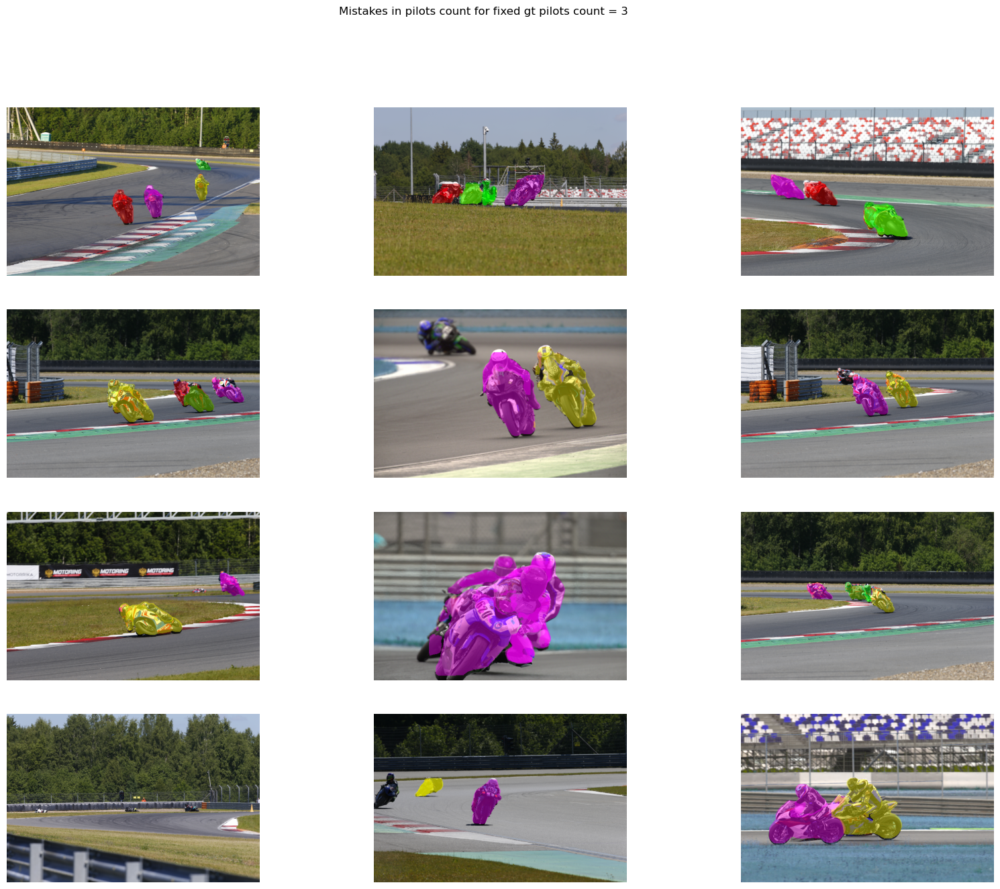

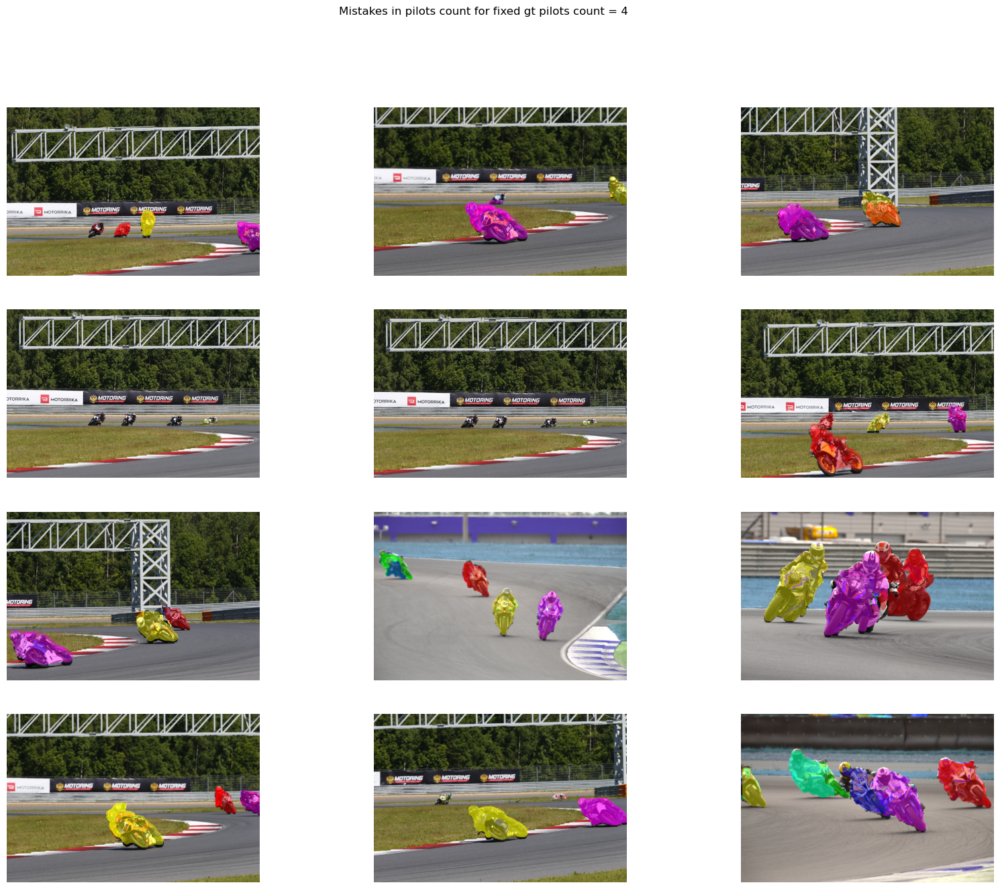

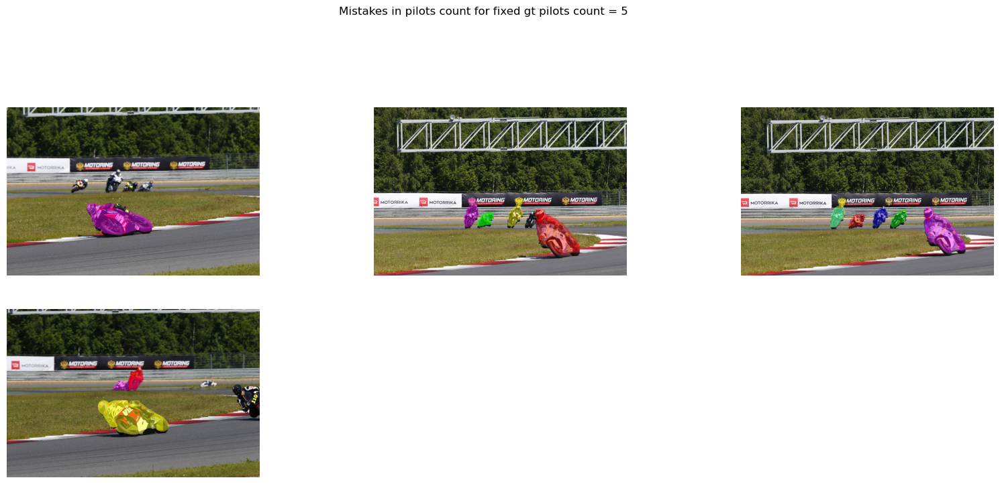

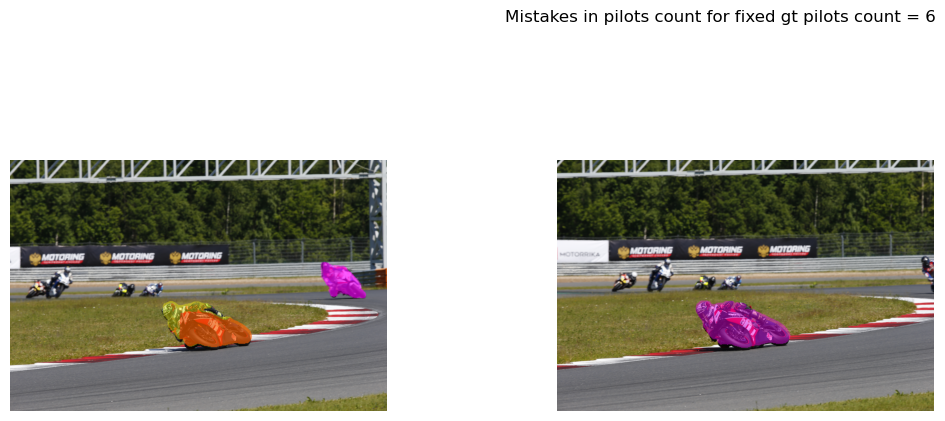

In [12]:
from src.render import show_examples, segment_moto_and_match_masks_on_image

for gt_pilots_count in range(max_gt_pilots_count + 1):
    show_examples(
        segment_moto_and_match_masks_on_image, processor1,
        f'Mistakes in pilots count for fixed gt pilots count = {gt_pilots_count}',
        None, img_paths=list(error_images_1[gt_pilots_count].keys())
    )

## Conclusions about the operation of the segmentation model and the matching algorithm

1. markup inaccuracies
2. dividing the mask of one motorcyclist into several
3. merging of motorcyclists' masks, strongly overlapping each other
4. not recognizing masks of motorcyclists who are far from the camera